### Streamer Feathering Visualization ###

This data analysis is designed to create a georeferenced image of a seismic streamer at different shot times to look for streamer feathering or other streamer malfunctions that may skew seismic tomography data collected from the streamer.

To start I loaded all of the libraries I may need (including some that I thought may be helpful that I did not end up using)

In [75]:
# Many of these libraries weren't used in the end but it didn't hurt to have them
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline
import collections
import pprint
import utm
import geopandas as gdp
from plotnine import ggplot, aes, geom_line
import os
import PIL
from PIL import Image
import glob
import imageio
import contextlib
import csv
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

Our first step is going to be reading in our desired data file and going through the header information to pull all the information we are going to want.

Paths may be subject to change based on where this code is running from

In [76]:
# Locating shot information from the first chunk of the file
# Open the file as a text file first

file = open('/Volumes/EODA/401_Final/Seq023_MGL2105PO12.P190')
text = file.readlines()

firstline = text[0]
print(firstline)

# This block tells us where we are surveying 
for row in text:
    if row[0:5] == 'H0100':
        Survey_Area = row[32:75]
        break

# This block shows us the date that the data was gathered on
for row in text:
    if row[0:5] == 'H0201':
        Date = row[32:64]
        break

# This block tells us the project
for row in text:
    if row[0:5] == 'H1800':
        Proj_Type = row[32:65]
        break

# This block gives us information about what utm zone we are in and what hemisphere/letter that zone is located in
for row in text:
    if row[0:5] == 'H1900':
        utmzone = row[32:38]
        Hemisphere = row[41:60]
        break

# Unlike the New Zealand data, there is not a shot number row
# We can determine how many shots there are by counting
    # The number of times that 'V' appears in the data 
    
# This is the code I used for the New Zealand p190 that would tell us the shot number
#for row in text:
    #if row[0:6] == 'H2600L':
        #Line = row[10:21]
        #Shots = row[47:70]
        #break
#for row in text:
    #print(text.count('VMGL'))

# explicit function to return the number of times the start of a shot appears
word = "VMGL2105PO12"
count = 0
with open('/Volumes/EODA/401_Final/Seq023_MGL2105PO12.P190', 'r') as file:
    for line in file:
        words = line.split()
        for i in words:
            if(i==word):
                count=count+1


print(Survey_Area)
print(Date)
print(Proj_Type)
print(utmzone)
print(Hemisphere)
#print(Line)
print("Number of Shots:", count)

H0100SURVEY AREA                Queen Charlotte Fault                           

Queen Charlotte Fault                      
Monday 02 August 2021 - 02:00pm 
001 UTM North                    
8N    
                   
Number of Shots: 253


Before we can begin creating .csv files we have to figure out how many rows to skip and the best chunk size

To do this I'm going to index the file to see how many rows I should skip to get to the beginning of the shot data

In [77]:
# A check to see what part of the line is the shot number
for row in text:
    if row[0:4] == 'VMGL':
        shot = row[20:26]
        break
print(shot)

# Now that we know the shot number we can find the lines that
# the shots start on

271495


In [78]:
# Find the total number of rows in the text file
with open('/Volumes/EODA/401_Final/Seq023_MGL2105PO12.P190') as file:
    length = len(file.readlines())
    print(length)
    
#Start of first shot (the number of rows we are going to skip) 
index1 = 0
for row in text:
    if row[0] == 'V':
        first_shot = index1
        break
    else:
        index1 += 1
print(index1)

#The row where the hydrophone data starts
index2 = 0
for row in text:
    if row[0] == 'R':
        first_strmer = index2
        break
    else:
        index2 += 1      
print(index2)

#How many lines are there between the start of the shot data and the first hydrophone location
index = index2 - index1
print(index)

103528
51
60
9


Before we can begin chunking the data we want to know how big each chunk (or shot) is going to be

In [80]:
# The chunksize is equivalent to the number of hydrophones/3
# You divide by 3 because there are 3 hydrophones per row of text

# Find the number of hydrophones
for row in text:
    if row[0:5] == 'H0104':
        hn = row[45:49]
        break
print(hn)

# Convert the number of hydrophones to an integer so you can perform math on it
num_hydro = int(hn)
print(num_hydro)
print(type(num_hydro))

# Math to figure out the chunk size
chunk = index + num_hydro/3
print(chunk)

1200
1200
<class 'int'>
409.0


If I want to be able to convert between UTM and lat lon I need to be able to pull the UTM zone that each data set is in and convert it into a usable form in future code lines (integer in this case).

In [81]:
# We have data from where the zone is located in the text file
print(utmzone)

# Since we know what information is correlated with the UTM zone, we can split it apart to get the zone number and the zone letter
for row in text:
    if row[0:5] == 'H1900':
        z = row[32]
        zone_l = row[33:38]
        break
print(z)

# Now convert that zone to an integer so we can use it in a future code line
zone = int(z)
print(zone)
print(zone_l)
print(type(zone))
print(type(zone_l))

# It is now an integer so we can call on it to convert utm to lat lon coordinates

8N    
8
8
N    
<class 'int'>
<class 'str'>


We now have all the preliminary information that will allow us to pull each individual shot and create a graph for it

The following code was created to read through the entire text file, create an independent csv for each chunk, make each chunk into a plot, and save both the csv and the figure. This steps takes a little bit of time... sorry.

Originally I had this code written so you could choose which shot you wanted to look at (from 0 to the value defined as the number of shots) which worked pretty well.

I ended up changing it so that I could take all the images and compile them into a gif, allowing us to see how the streamer is moving for each shot. 

The individual steps have notes attached with them with some chunks of code # out to show where thinking changed or where you can bring back in saving individual shots rather than having to save all 253 csv files and associated images.

### WARNING: The following block of code will download and store 253 individual csv files and images ###

**Proceed with caution**

In [82]:
# This is the code that will allow us to make CVS files for all the shots

my_cols = [str(i) for i in range(6)] # create some col names

# First we must read in the file and tell it the required information to chunk the text file accordingly
with pd.read_csv('/Volumes/EODA/401_Final/Seq023_MGL2105PO12.P190', 
                 skiprows = index1, 
                 #sep="\s+|R", 
                 chunksize= chunk, 
                 names=my_cols,
                 #skiprows=[0,1,2],
                 header=None) as reader:
    reader
    
    # We now will make empty lists for the information to be appended to when it is read from the file
    for idx, chunk in enumerate(reader): 
        sht = []
        hnum = []
        hydrox = []
        hydroy = []
        hydroz = []
        # Choose what chunk you want (0 to count) depending on what shot it is 
        #n = 
        #if idx == n:
            
        # This modified if statement tells python where to look in the file for each piece of information
        for idx2, line in enumerate(range(chunk.shape[0])):
            #set this first conditional for one of first three lines of the chunk
            if idx2 == 0:
                print(chunk.iloc[line,0][20:26]) #This is what will be saved as shot number
                shttmp = chunk.iloc[line,0][20:26] 
            #set this second conditional for the hydrophone lines - the ones that start with R
            elif idx2>(index-1):
                hnum_tmp = chunk.iloc[line,0][1:5] # This is the hydrophone number
                x_tmp = chunk.iloc[line,0][6:14] # Easting utm coordinates
                y_tmp = chunk.iloc[line,0][14:23] # Northing utm coordinates
                z_tmp = chunk.iloc[line,0][23:28] # Depth of the hydrophone
                    
                # Convert all the numbers to integers
                # UTM coordinates have a decimal... so have to use float
                #sht_int = float(shttmp) (these two bits of data don't need to be converted to a float because they won't get modified in the dataframe)
                #hnum_int = float(hnum_tmp)
                x_flt = float(x_tmp)
                y_flt = float(y_tmp)
                z_flt = float(z_tmp)
                    
                # Then add the informaiton to a list - append adds it to the end of the list
                sht.append(shttmp)
                hnum.append(hnum_tmp)
                hydrox.append(x_flt)
                hydroy.append(y_flt)
                hydroz.append(z_flt)
        # We are now out of the for loop allowing us to add the information to a shot specific dataframe  
        # The datafram will also be saved to a CSV File
        shot_data = pd.DataFrame({'shot' : sht,
                            'hydrophone' : hnum,
                            'x' : hydrox,
                            'y' : hydroy,
                            'depth' : hydroz,
                                }, 
                            columns = ['shot', 'hydrophone', 'x', 'y', 'depth'])
            
        #Convert UTM to lat lon
        shot_data['lat'], shot_data['lon'] = pd.Series(utm.to_latlon(shot_data['x'], shot_data['y'], zone, zone_l))
        
        # We are assiging depth to be a float so we can use it as a color indicator for our graphs
        shot_data = shot_data.astype({'depth':'float'})
        
        # This is our graph without the basemap

        #creating the figure
        fig = plt.figure(figsize=(20,10))
        ax = fig.subplots()
        norm= mpl.colors.Normalize()

        # We need to limit the number of tick marks on the x and y axis so we don't get every single hydrophone coordinate on the axis
        ax.xaxis.set_major_locator(plt.MaxNLocator(10))
        ax.yaxis.set_major_locator(plt.MaxNLocator(10))

        #Type of plot with axis and figure features defined (and color bar added)
        splot = ax.scatter(shot_data['lon'], shot_data['lat'], c= shot_data['depth'], 
                               norm = norm, cmap=plt.cm.get_cmap('winter', 50))
        ax.grid()

        # Color bar
        cbar = plt.colorbar(splot, ax=ax, shrink = 0.65, extend = 'both', pad = 0.01)
        cbar.set_label('Depth [m]', labelpad= 10, size = 12)
        cbar.ax.invert_yaxis()

        #Labeling the axes and figure
        ax.set_xlabel("Latitude(\N{DEGREE SIGN})", size = 15)
        ax.set_ylabel("Longitude (\N{DEGREE SIGN})", size = 15)
        ax.set_title('Streamer Position', size = 20)
            
        # Save the image so I can hopefully create an animation later
        plt.savefig(shttmp + '.png')  
        plt.close(fig)
        
        # Finally we will save the shot data to a csv so we can keep the data organized
        filenm = shttmp+'.csv'
        print('writing '+filenm)
        shot_data.to_csv(filenm)

271495


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271495.csv
271505


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271505.csv
271515


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271515.csv
271525


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271525.csv
271535


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271535.csv
271545


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271545.csv
271555


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271555.csv
271565


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271565.csv
271575


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271575.csv
271585


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271585.csv
271595


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271595.csv
271605


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271605.csv
271615


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271615.csv
271625


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271625.csv
271635


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271635.csv
271645


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271645.csv
271655


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271655.csv
271665


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271665.csv
271675


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271675.csv
271685


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271685.csv
271695


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271695.csv
271705


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271705.csv
271715


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271715.csv
271725


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271725.csv
271735


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271735.csv
271745


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271745.csv
271755


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271755.csv
271765


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271765.csv
271775


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271775.csv
271785


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271785.csv
271795


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271795.csv
271805


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271805.csv
271815


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271815.csv
271825


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271825.csv
271835


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271835.csv
271845


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271845.csv
271855


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271855.csv
271865


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271865.csv
271875


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271875.csv
271885


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271885.csv
271895


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271895.csv
271905


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271905.csv
271915


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271915.csv
271925


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271925.csv
271935


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271935.csv
271945


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271945.csv
271955


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271955.csv
271965


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271965.csv
271975


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271975.csv
271985


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271985.csv
271995


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 271995.csv
272005


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272005.csv
272015


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272015.csv
272025


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272025.csv
272035


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272035.csv
272045


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272045.csv
272055


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272055.csv
272065


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272065.csv
272075


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272075.csv
272085


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272085.csv
272095


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272095.csv
272105


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272105.csv
272115


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272115.csv
272125


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272125.csv
272135


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272135.csv
272145


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272145.csv
272155


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272155.csv
272165


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272165.csv
272175


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272175.csv
272185


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272185.csv
272195


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272195.csv
272205


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272205.csv
272215


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272215.csv
272225


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272225.csv
272235


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272235.csv
272245


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272245.csv
272255


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272255.csv
272265


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272265.csv
272275


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272275.csv
272285


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272285.csv
272295


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272295.csv
272305


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272305.csv
272315


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272315.csv
272325


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272325.csv
272335


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272335.csv
272345


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272345.csv
272355


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272355.csv
272365


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272365.csv
272375


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272375.csv
272385


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272385.csv
272395


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272395.csv
272405


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272405.csv
272415


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272415.csv
272425


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272425.csv
272435


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272435.csv
272445


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272445.csv
272455


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272455.csv
272465


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272465.csv
272475


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272475.csv
272485


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272485.csv
272495


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272495.csv
272505


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272505.csv
272515


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272515.csv
272525


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272525.csv
272535


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272535.csv
272545


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272545.csv
272555


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272555.csv
272565


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272565.csv
272575


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272575.csv
272585


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272585.csv
272595


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272595.csv
272605


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272605.csv
272615


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272615.csv
272625


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272625.csv
272635


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272635.csv
272645


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272645.csv
272655


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272655.csv
272665


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272665.csv
272675


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272675.csv
272685


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272685.csv
272695


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272695.csv
272705


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272705.csv
272715


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272715.csv
272725


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272725.csv
272735


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272735.csv
272745


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272745.csv
272755


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272755.csv
272765


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272765.csv
272775


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272775.csv
272785


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272785.csv
272795


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272795.csv
272805


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272805.csv
272815


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272815.csv
272825


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272825.csv
272835


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272835.csv
272845


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272845.csv
272855


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272855.csv
272865


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272865.csv
272875


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272875.csv
272885


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272885.csv
272895


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272895.csv
272905


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272905.csv
272915


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272915.csv
272925


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272925.csv
272935


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272935.csv
272945


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272945.csv
272955


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272955.csv
272965


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272965.csv
272975


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272975.csv
272985


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272985.csv
272995


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 272995.csv
273005


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273005.csv
273015


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273015.csv
273025


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273025.csv
273035


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273035.csv
273045


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273045.csv
273055


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273055.csv
273065


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273065.csv
273075


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273075.csv
273085


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273085.csv
273095


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273095.csv
273105


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273105.csv
273115


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273115.csv
273125


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273125.csv
273135


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273135.csv
273145


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273145.csv
273155


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273155.csv
273165


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273165.csv
273175


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273175.csv
273185


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273185.csv
273195


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273195.csv
273205


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273205.csv
273215


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273215.csv
273225


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273225.csv
273235


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273235.csv
273245


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273245.csv
273255


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273255.csv
273265


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273265.csv
273275


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273275.csv
273285


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273285.csv
273295


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273295.csv
273305


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273305.csv
273315


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273315.csv
273325


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273325.csv
273335


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273335.csv
273345


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273345.csv
273355


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273355.csv
273365


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273365.csv
273375


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273375.csv
273385


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273385.csv
273395


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273395.csv
273405


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273405.csv
273415


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273415.csv
273425


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273425.csv
273435


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273435.csv
273445


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273445.csv
273455


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273455.csv
273465


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273465.csv
273475


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273475.csv
273485


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273485.csv
273495


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273495.csv
273505


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273505.csv
273515


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273515.csv
273525


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273525.csv
273535


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273535.csv
273545


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273545.csv
273555


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273555.csv
273565


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273565.csv
273575


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273575.csv
273585


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273585.csv
273595


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273595.csv
273605


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273605.csv
273615


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273615.csv
273625


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273625.csv
273635


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273635.csv
273645


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273645.csv
273655


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273655.csv
273665


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273665.csv
273675


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273675.csv
273685


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273685.csv
273695


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273695.csv
273705


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273705.csv
273715


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273715.csv
273725


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273725.csv
273735


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273735.csv
273745


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273745.csv
273755


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273755.csv
273765


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273765.csv
273775


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273775.csv
273785


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273785.csv
273795


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273795.csv
273805


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273805.csv
273815


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273815.csv
273825


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273825.csv
273835


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273835.csv
273845


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273845.csv
273855


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273855.csv
273865


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273865.csv
273875


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273875.csv
273885


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273885.csv
273895


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273895.csv
273905


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273905.csv
273915


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273915.csv
273925


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273925.csv
273935


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273935.csv
273945


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273945.csv
273955


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273955.csv
273965


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273965.csv
273975


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273975.csv
273985


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273985.csv
273995


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 273995.csv
274005


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 274005.csv
274015


Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

writing 274015.csv


Now that we have all the csv files and images created lets double check that all the desired information is in them

You can choose what data file you want to look at specifically, but I left it blank so the last file will be chosen automatically. 

In [83]:
# Information about the dataframe we created and the information it hold
shot_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   shot        400 non-null    object 
 1   hydrophone  400 non-null    object 
 2   x           400 non-null    float64
 3   y           400 non-null    float64
 4   depth       400 non-null    float64
 5   lat         400 non-null    float64
 6   lon         400 non-null    float64
dtypes: float64(5), object(2)
memory usage: 22.0+ KB


In [84]:
shot_data.head()

,shot,hydrophone,x,y,depth,lat,lon
0,274015,1,475896.4,6123698.4,16.8,55.259176,-135.379254
1,274015,4,475864.0,6123679.3,16.6,55.259002,-135.379762
2,274015,7,475831.7,6123660.2,16.2,55.258829,-135.380268
3,274015,10,475799.3,6123641.1,15.8,55.258656,-135.380776
4,274015,13,475767.0,6123622.0,15.3,55.258483,-135.381283


lets open some of the figures and see how they look!

You have to put in the full path name in order to open the picture

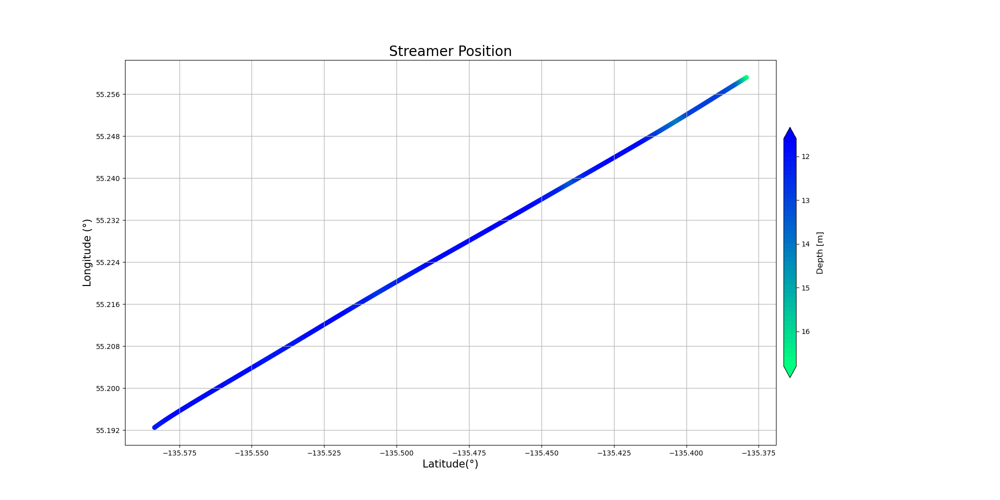

In [85]:
Image.open('/Volumes/EODA/Final_Project/274015.png')

# Double clicking on the image makes it bigger

Look at that!!! A great image! 

A very straight streamer that looks fantastic (in my opinion)

The coordinates are in lat lon so we have a more useful/recognizable coordinate system!

Since this is the last image of the sequence lets take a look at the first image

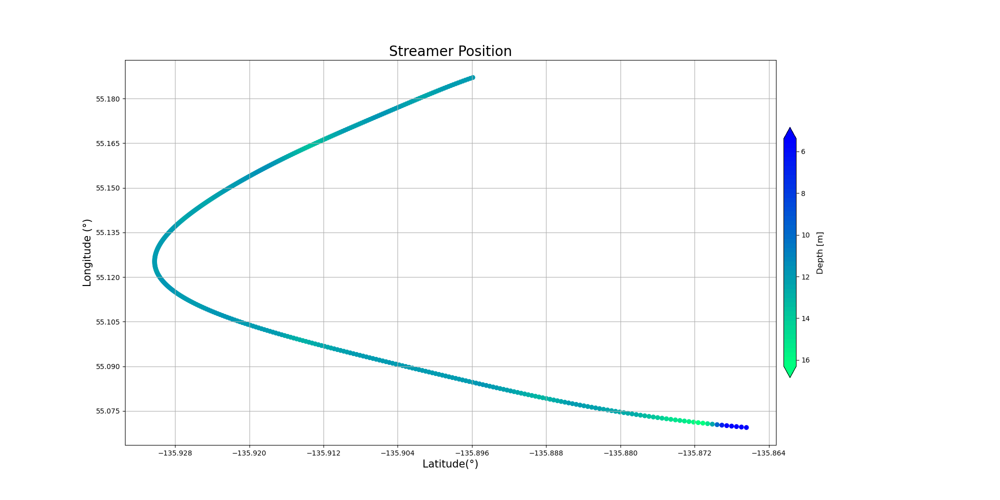

In [86]:
Image.open('/Volumes/EODA/Final_Project/271495.png')

We can see that the strating position of the streamer is curved.
This means that somewhere in the 253 shots the streamer was curved but then straightened out

Since we don't want to look through every individual picture we can create a gif to visualize the streamer position in the water for each shot 

In [87]:
# These two lines define where the computer should be looking for our images and what we want to name the resulting .gif
fp_in = '/Volumes/EODA/Final_Project/*.png'
fp_out = '/Volumes/EODA/Final_Project/streamer_feathering.gif'

# This chunk of code takes all the images, opens them, stacks them together, and creates a image that goes through each of the images in one file
with contextlib.ExitStack() as stack:
    imgs = (stack.enter_context(Image.open(f))
            for f in sorted(glob.glob(fp_in)))
    img = next(imgs)      
    img.save(fp = fp_out, format = 'GIF', append_images = imgs,
             save_all = True, duration = 100, loop = 0)
            # Duration is the time for each image (100 ms in this case) and loop is how many times it will repeat (a loop of 0 means it will repeat indefinitely)
        
    # The gif file is somewhat large. There is a way to minimize the file size but I could not get it to work effectively and put out quality of gif that I wanted.

Now that we have made our gif lets run it!!!

Using the pathname for the .gif we can display/play the gif in the jupyter notebook

In [89]:
# More information we need to bring into our notebook in order for the .gif to open and run
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display

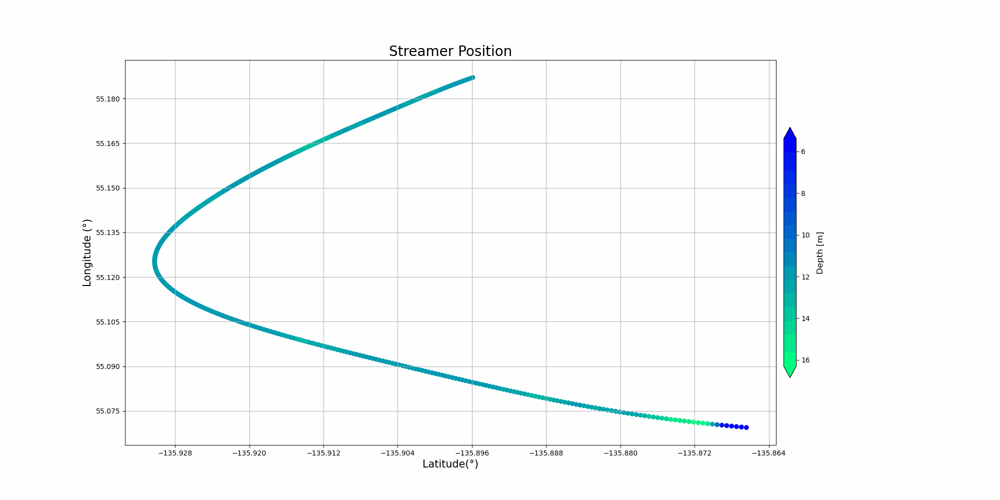

In [95]:
# This tells the computer to open the .gif file and run it as we specified when we made it (duration, loop, etc.)
from pathlib import Path
gifPath = Path("/Volumes/EODA/Final_Project/streamer_feathering.gif")
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

We were able to compile an image for every shot in the file and create a gif outlining how the streamer is moving in the water.

To add to this we can try to add a basemap to see how the streamer looks in relation to the coastline

Text(0.5, 0, 'Latitude(°)')

Text(0, 0.5, 'Longitude (°)')

Text(0.5, 1.0, 'Streamer Position')

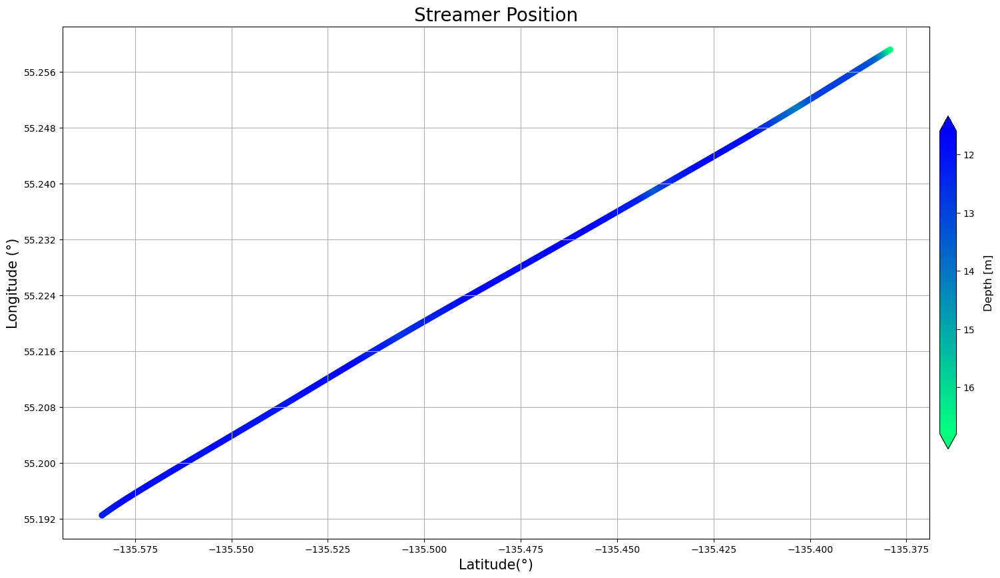

In [93]:
# This is our graph without the basemap

#creating the figure
fig = plt.figure(figsize=(20,10))
ax = fig.subplots()
norm= mpl.colors.Normalize()

# We need to limit the number of tick marks on the x and y axis so we don't get every single hydrophone coordinate on the axis
ax.xaxis.set_major_locator(plt.MaxNLocator(10))
ax.yaxis.set_major_locator(plt.MaxNLocator(10))

#Type of plot with axis and figure features defined (and color bar added)
splot = ax.scatter(shot_data['lon'], shot_data['lat'], c= shot_data['depth'], 
                               norm = norm, cmap=plt.cm.get_cmap('winter', 50))
ax.grid()

# Color bar
cbar = plt.colorbar(splot, ax=ax, shrink = 0.65, extend = 'both', pad = 0.01)
cbar.set_label('Depth [m]', labelpad= 10, size = 12)
cbar.ax.invert_yaxis()

#Labeling the axes and figure
ax.set_xlabel("Latitude(\N{DEGREE SIGN})", size = 15)
ax.set_ylabel("Longitude (\N{DEGREE SIGN})", size = 15)
ax.set_title('Streamer Position', size = 20)

Now lets add a coastline

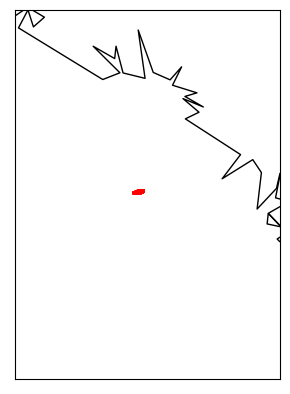

In [94]:
# Using the graph above we can pull the corner lat lon values
# I set the coordinates relatively large in hopes of seeing the coastline in the graph
m = Basemap(projection='mill',
            llcrnrlat = 50,
            llcrnrlon = -140,
            urcrnrlat = 60,
            urcrnrlon = -130)
m.drawcoastlines()

lat = shot_data['lat']
lon = shot_data['lon']

lons, lats = m(lon, lat)
m.scatter(lons, lats, marker = 1, color = 'r')

plt.show()

Though this is really cool to see, I think for the sake of seeing the streamer, the original gif we made, without the coastline, is best. This is due to the movement of the streamer. There is not a good window that allows us to see the streamer moving around well also giving us an adiquate view of the coastline.

A better use of this basemap feature may to be plotting the entire path taken rather than just an individual shot. This would allow us to visualize how much the streamer is moving in whole rather than its movemenets in distinct moments of time.

**What else can I do with this project?**

Looking at the data analysis that I have accomplished already there are further steps I could take in order to improve what I already have.

Some ideas I have:
- Try to create a basemap that follows the streamer as it moves, creating a path that the boat/streamer has taken rather than just the shape of the streamer at different instances in time.
    - This could allow us to map some bottom topography too so we could show where the Queen Charolette Fault is in relation to the streamer.
- The current code only pulls data from every third hydrophone since they are located at the beginning of each line. I could write a more comprehensive code that pulls the information for all 3 streamers and adds them to a list
    - I know that the .extend() feature works rather well for this rather than using .append().
- To test how well/universal this code is I can try to run it on multiple different p190 files to see if it is compatible across different projects.
    - I tried my best to make each number that I was using defined by a part of the p190 file rather than me hard coding in a numeral.
    - This should (hopefully) allow other files to be read in and each unique integer is read and assigned to a variable that will be read instead.
    
Overall, I am very happy with where I ended up with this project. It took me quite a while to get to this point and I am proud of the work that I have put in. With time permitting I will try some of the ideas above in hopes that I can create a more comprehensize and well rounded project.